# Bike Safety EPJ model in Washington DC

Should get:
* accident severity
* accident distance from intersection
* road characteristics:
    * max speed
    * number of lanes
    * width
    * curvature
    * type of road
    * bike lane type
    * traffic volume
    * cycling volume

## Retain relevant OSM
Use OSM line info (only when highway is not Null)

In [51]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point

In [44]:
highways = gpd.read_file(r'..\dc_lines_osm.geojson')
highways

,osm_id,name,highway,waterway,aerialway,barrier,man_made,z_order,other_tags,geometry
0,4681186,None,service,None,None,None,None,0,None,"LINESTRING (-77.10826 38.93574, -77.10826 38.9..."
1,4725152,Texas Avenue Southeast,secondary,None,None,None,None,6,"""HFCS""=>""Collector"",""lanes""=>""1"",""name:etymolo...","LINESTRING (-76.93866 38.88917, -76.93838 38.8..."
2,5967442,Allan Road,residential,None,None,None,None,3,"""lcn""=>""yes"",""maxspeed""=>""20 mph"",""sidewalk:bo...","LINESTRING (-77.10231 38.95533, -77.10227 38.9..."
3,5968135,Summerfield Road,residential,None,None,None,None,3,"""lane_markings""=>""no"",""surface""=>""asphalt""","LINESTRING (-77.07191 38.97399, -77.07156 38.9..."
4,5968393,Albemarle Street,residential,None,None,None,None,3,"""maxspeed""=>""20 mph"",""sidewalk""=>""no"",""surface...","LINESTRING (-77.10253 38.94790, -77.10264 38.9..."
...,...,...,...,...,...,...,...,...,...,...
88450,1445836671,None,service,None,None,None,None,0,"""access""=>""private""","LINESTRING (-77.01518 38.90502, -77.01525 38.9..."
88451,1445836672,New York Avenue Northwest,trunk,None,None,None,None,8,"""HFCS""=>""Principal Arterial"",""NHS""=>""yes"",""des...","LINESTRING (-77.01586 38.90500, -77.01602 38.9..."
88452,1445943511,None,service,None,None,None,None,0,None,"LINESTRING (-77.02390 38.91957, -77.02382 38.9..."
88453,1445943512,None,service,None,None,None,None,0,None,"LINESTRING (-77.02371 38.91957, -77.02371 38.9..."


In [5]:
#see what the highway types are
highways['highway'].value_counts()

footway           44617
service           17454
residential        5211
primary            2971
secondary          2162
cycleway           2054
tertiary           1979
steps              1540
path                807
motorway            527
motorway_link       468
unclassified        449
trunk               418
primary_link        330
proposed            129
pedestrian          111
secondary_link       83
trunk_link           53
tertiary_link        52
living_street        51
bridleway            45
track                44
corridor             33
construction         26
elevator              6
services              1
Name: highway, dtype: int64

Remove:
* footway (unless "bicycle"="yes" or "cycleway"="yes")
* steps
* elevator
* path (if "bicycle"="no" or "cycleway"="no")
* proposed
* pedestrian (unless "bicycle"="yes", "bicycle"="designated", "cycleway"="track")
* bridleway

for anything with '_link' remove that

In [47]:
highways = highways[~((highways['highway'] == 'footway') & ~(highways['other_tags'].str.contains('"bicycle"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"yes"', na=False)))]
highways = highways[highways['highway']!= 'steps']
highways = highways[~((highways['highway'] == 'path') & (highways['other_tags'].str.contains('"bicycle"=>"no"', na=False) | highways['other_tags'].str.contains('"cycleway"=>"no"', na=False)))]
highways = highways[highways['highway']!= 'proposed']
highways = highways[highways['highway']!= 'bridleway']
highways = highways[~((highways['highway'] == 'pedestrian') & ~(highways['other_tags'].str.contains('"bicycle"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"yes"', na=False) |
                                                            highways['other_tags'].str.contains('"cycleway"=>"track"', na=False) |
                                                            highways['other_tags'].str.contains('"bicycle"=>"designated"', na=False)))]
highways.to_file('highways_relevant.geojson')


C:\Users\cle9a\anaconda3\envs\rcp2Lite3\lib\site-packages\geopandas\io\file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


In [57]:
#look at tags
tags = {}
for it, row in highways.iterrows():
    if row['other_tags'] is not None:
        for s in row['other_tags'].split(','):
            curr =  s.split('=>')[0]
            if curr not in tags.keys():
                tags[curr] = 0
            else:
                tags[curr] = tags[curr] +1

In [61]:
from collections import Counter
tags_counter = Counter(tags)
tags_counter.most_common(100)

[('"surface"', 18545),
 ('"oneway"', 10767),
 ('"lanes"', 9867),
 ('"service"', 8977),
 ('"HFCS"', 7131),
 ('"source:HFCS"', 6470),
 ('"maxspeed"', 5080),
 ('"tiger:cfcc"', 5034),
 ('"tiger:county"', 5018),
 (' DC"', 4766),
 ('"tiger:name_base"', 4495),
 ('"tiger:name_type"', 4470),
 ('"tiger:name_direction_suffix"', 4242),
 ('"tiger:zip_left"', 3721),
 ('"tiger:zip_right"', 3579),
 ('"bicycle"', 3463),
 ('"tiger:reviewed"', 3340),
 ('"access"', 3286),
 ('"name:etymology:wikidata"', 3099),
 ('"foot"', 3068),
 ('"sidewalk"', 3064),
 ('"lane_markings"', 2613),
 ('"lit"', 2365),
 ('"sidewalk:both"', 1723),
 ('"ref"', 1556),
 ('"cycleway:right"', 1529),
 ('"cycleway"', 1512),
 ('"layer"', 1470),
 ('"NHS"', 1468),
 ('"sidewalk:right"', 1454),
 ('"sidewalk:left"', 1401),
 ('"turn:lanes"', 1345),
 ('"lanes:forward"', 1264),
 ('"lanes:backward"', 1262),
 ('"hgv"', 1020),
 ('"railway"', 1017),
 ('"operator"', 990),
 ('"crossing"', 962),
 ('"level"', 946),
 ('"motor_vehicle"', 916),
 ('"crossing

In [60]:
len(tags)

741

In [67]:
tags['"cycleway:oneway"']

116

In [69]:
potentially_useful = ['"HFCS"', '"lanes"', '"oneway"', '"maxspeed"', '"bicycle"', '"NHS"', '"expressway"', '"oneway:conditional"', 
        '"tiger:separated"', '"parking:left"', '"parking:right"', '"parking:right:orientation"', '"source:width"', 
        '"cycleway"', '"shoulder"', '"cycleway:right"', '"cycleway:right:buffer"', '"parking:both"', 
        '"parking:both:orientation"', '"access"',  '"motor_vehicle"','"foot"',  '"turn:lanes"', '"bridge"',
       '"tunnel"', '"bicycle_road"', '"bridge:name"', '"lanes:backward"', '"lanes:forward"', '"turn:lanes:backward"',
        '"turn:lanes:forward"', '"cycleway:left"','"cycleway:right:lane"', '"cycleway:both"','"parking:lane:right"',
         '"cycleway:both:lane"','"change:lanes:backward"', '"change:lanes:forward"', '"cycleway:left:lane"',
         '"cycleway:left:oneway"', '"parking"', '"cycleway:lane"','"cycleway:lanes"', '"lanes:bus"',  '"parking:lane:left"', 
        '"cycleway:oneway"', '"cycleway:separation"', '"bicycle:lanes"', '"surface"', '"cycleway:surface"' ]
print(len(potentially_useful))
keep = []
for t in potentially_useful:
    if tags[t] >=25:
        keep.append(t)
print(len(keep))
keep

50
39


['"HFCS"',
 '"lanes"',
 '"oneway"',
 '"maxspeed"',
 '"bicycle"',
 '"NHS"',
 '"expressway"',
 '"oneway:conditional"',
 '"parking:left"',
 '"parking:right"',
 '"parking:right:orientation"',
 '"source:width"',
 '"cycleway"',
 '"shoulder"',
 '"cycleway:right"',
 '"cycleway:right:buffer"',
 '"parking:both"',
 '"parking:both:orientation"',
 '"access"',
 '"motor_vehicle"',
 '"foot"',
 '"turn:lanes"',
 '"bridge"',
 '"tunnel"',
 '"bridge:name"',
 '"lanes:backward"',
 '"lanes:forward"',
 '"turn:lanes:backward"',
 '"turn:lanes:forward"',
 '"cycleway:left"',
 '"cycleway:right:lane"',
 '"cycleway:both"',
 '"parking:lane:right"',
 '"cycleway:both:lane"',
 '"cycleway:left:lane"',
 '"cycleway:left:oneway"',
 '"cycleway:oneway"',
 '"cycleway:separation"',
 '"surface"']

In [71]:
highways.to_file(r'..\osm_highway_limited.geojson')

C:\Users\cle9a\anaconda3\envs\rcp2Lite3\lib\site-packages\geopandas\io\file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


In [77]:
highways = highways.reindex(columns=highways.columns.tolist() + keep, fill_value=np.nan)
highways

,osm_id,name,highway,waterway,aerialway,barrier,man_made,z_order,other_tags,geometry,...,"""cycleway:left""","""cycleway:right:lane""","""cycleway:both""","""parking:lane:right""","""cycleway:both:lane""","""cycleway:left:lane""","""cycleway:left:oneway""","""cycleway:oneway""","""cycleway:separation""","""surface"""
0,4681186,None,service,None,None,None,None,0,None,"LINESTRING (-77.10826 38.93574, -77.10826 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4725152,Texas Avenue Southeast,secondary,None,None,None,None,6,"""HFCS""=>""Collector"",""lanes""=>""1"",""name:etymolo...","LINESTRING (-76.93866 38.88917, -76.93838 38.8...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5967442,Allan Road,residential,None,None,None,None,3,"""lcn""=>""yes"",""maxspeed""=>""20 mph"",""sidewalk:bo...","LINESTRING (-77.10231 38.95533, -77.10227 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5968135,Summerfield Road,residential,None,None,None,None,3,"""lane_markings""=>""no"",""surface""=>""asphalt""","LINESTRING (-77.07191 38.97399, -77.07156 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5968393,Albemarle Street,residential,None,None,None,None,3,"""maxspeed""=>""20 mph"",""sidewalk""=>""no"",""surface...","LINESTRING (-77.10253 38.94790, -77.10264 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88450,1445836671,None,service,None,None,None,None,0,"""access""=>""private""","LINESTRING (-77.01518 38.90502, -77.01525 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88451,1445836672,New York Avenue Northwest,trunk,None,None,None,None,8,"""HFCS""=>""Principal Arterial"",""NHS""=>""yes"",""des...","LINESTRING (-77.01586 38.90500, -77.01602 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88452,1445943511,None,service,None,None,None,None,0,None,"LINESTRING (-77.02390 38.91957, -77.02382 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88453,1445943512,None,service,None,None,None,None,0,None,"LINESTRING (-77.02371 38.91957, -77.02371 38.9...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
i = 0
for it, row in highways.iterrows():
    if i%50 == 0:
        print(i)
    i = i + 1
    if row['other_tags'] is not None:
        for s in row['other_tags'].split(','):
            curr =  s.split('=>')[0]
            if curr in keep:
                highways.loc[it, curr] = s.split('=>')[1]
    

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950
1000
1050
1100
1150
1200
1250
1300
1350
1400
1450
1500
1550
1600
1650
1700
1750
1800
1850
1900
1950
2000
2050
2100
2150
2200
2250
2300
2350
2400
2450
2500
2550
2600
2650
2700
2750
2800
2850
2900
2950
3000
3050
3100
3150
3200
3250
3300
3350
3400
3450
3500
3550
3600
3650
3700
3750
3800
3850
3900
3950
4000
4050
4100
4150
4200
4250
4300
4350
4400
4450
4500
4550
4600
4650
4700
4750
4800
4850
4900
4950
5000
5050
5100
5150
5200
5250
5300
5350
5400
5450
5500
5550
5600
5650
5700
5750
5800
5850
5900
5950
6000
6050
6100
6150
6200
6250
6300
6350
6400
6450
6500
6550
6600
6650
6700
6750
6800
6850
6900
6950
7000
7050
7100
7150
7200
7250
7300
7350
7400
7450
7500
7550
7600
7650
7700
7750
7800
7850
7900
7950
8000
8050
8100
8150
8200
8250
8300
8350
8400
8450
8500
8550
8600
8650
8700
8750
8800
8850
8900
8950
9000
9050
9100
9150
9200
9250
9300
9350
9400
9450
9500
9550
9600
9650
9700
9750
9800
9850
9900
9950
10000
10050
10100
10150

In [86]:
highways[['"maxspeed"']].value_counts()

"maxspeed"
"25 mph"      2214
"15 mph"       772
"30 mph"       660
"20 mph"       365
"40 mph"       263
"35 mph"       174
"45 mph"       158
"50 mph"       145
"10 mph"        84
"65 mph"        61
"75 mph"        54
"5 mph"         52
"55 mph"        36
"95 mph"        12
"70 mph"         8
"125 mph"        6
"24.14"          5
"30"             4
"5"              3
"15"             3
"24 mph"         1
"20"             1
dtype: int64

## Get edges and nodes
This will let use treat the road network as a graph as well as give us the road segments (as defined by a line between intersections) we need. This does mean that if a cyclelane is a separate line in OSM, it will be it's own road segment.

First, merge all the lines together. This means we'll lose the OSM info. Not sure if it makes sense to join the osm info back to the line segments or just match an accident point to a line segment and well as an OSM entry. OSM roads aren't alwasy broken up at intersections, hence why we need to work with the geomtery.

In [ ]:
highways = gpd.read_file(r'..\osm_highway_limited.geojson')
highways

In [5]:
#merge all roads into multilnestring
all_roads = highways['geometry'].union_all()
print(all_roads.length)
all_roads

55.91423238497494


In [21]:
print(len(all_roads.geoms))
print(all_roads.geoms[0])

100923
LINESTRING (-77.1082606 38.935738, -77.108256 38.9358304, -77.1082555 38.9359244)


In [18]:
#union = gpd.GeoDataFrame({'id':[0]}, crs=highways.crs, geometry=[all_roads])
#union.plot()

89718


<Axes: >

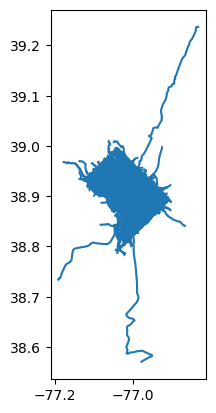

In [59]:
#https://gis.stackexchange.com/questions/360344/finding-where-line-intersects-itself-with-python
from shapely.ops import linemerge
#potentially gets rid of disconnected roads?
#separate out roads at intersections

lm = gpd.GeoDataFrame({'id':[0]}, crs=highways.crs, geometry=[linemerge(all_roads)]).explode().reset_index(drop=True)
print(len(lm))
lm.plot()

In [60]:
#sanity check
l = linemerge(all_roads)
print(len(l.geoms))
print(l.geoms[0])
print(len(lm))
print(lm['geometry'][0])

89718
LINESTRING (-77.1926236 38.7331591, -77.1923178 38.7335273, -77.1916258 38.7331716, -77.1900809 38.7350045, -77.1900058 38.73531, -77.1899414 38.7364147, -77.1900111 38.7365527, -77.1899843 38.7369503, -77.1863043 38.737126, -77.1840513 38.7429169, -77.1832037 38.7452432, -77.182619 38.7465193, -77.1817929 38.7481468, -77.1810687 38.7494396, -77.1799529 38.7513222, -77.1781343 38.7542966, -77.1769542 38.7561164, -77.1748835 38.7594085, -77.1731401 38.7622906, -77.1726304 38.7629808, -77.1721637 38.7635287, -77.1714985 38.7641269, -77.1709138 38.7646121, -77.170372 38.7649676, -77.169562 38.7654277, -77.16887 38.7657414, -77.1652114 38.7672681, -77.1635646 38.768021, -77.1618909 38.768962, -77.161451 38.7692674, -77.1610004 38.7695267, -77.1599007 38.7705765, -77.1590424 38.7714548, -77.1580339 38.772952, -77.1574438 38.7740562, -77.1571809 38.7748675, -77.156226 38.7803794, -77.1555018 38.7846907, -77.1554107 38.7854936, -77.1547508 38.7892653, -77.1544665 38.789813, -77.154091 3

In [61]:
lm['SegID'] = range(len(lm))
lm

,id,geometry,SegID
0,0,"LINESTRING (-77.19262 38.73316, -77.19232 38.7...",0
1,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",1
2,0,"LINESTRING (-77.1246 38.93853, -77.12486 38.93...",2
3,0,"LINESTRING (-77.11525 38.94317, -77.11538 38.9...",3
4,0,"LINESTRING (-77.13826 38.93569, -77.13821 38.9...",4
...,...,...,...
89713,0,"LINESTRING (-76.93777 38.9053, -76.93773 38.90...",89713
89714,0,"LINESTRING (-76.93375 38.91331, -76.93458 38.9...",89714
89715,0,"LINESTRING (-76.91824 38.88721, -76.91821 38.8...",89715
89716,0,"LINESTRING (-76.918 38.88716, -76.91798 38.887...",89716


In [ ]:
lm.to_file(r'..\line_merge.geojson')
#this should be our edges? (road segments between intersections)

In [ ]:
#helper functions for link above to get start and end points
def get_endpoints(gdf):
    startpoint = gdf.geometry.apply(lambda x: x.coords[0])
    endpoint = gdf.geometry.apply(lambda x: x.coords[-1])

    startpoints = [Point(i) for i in startpoint]
    endpoints = [Point(i) for i in endpoint]

    return startpoints, endpoints

def create_endpoints(startpoints, endpoints, lm):
    geom = []
    for a,b in zip(startpoints, endpoints):
        geom.append(a)
        geom.append(b)

    endpoints = gpd.GeoDataFrame({'PointID': range(0, len(geom))}, crs=lm.crs, geometry=geom)
    return endpoints

In [ ]:
startpoints, endpoints = get_endpoints(lm)
endpoints_singleList = create_endpoints(startpoints, endpoints, lm)

fig, ax = plt.subplots()
highways.plot(ax=ax)
endpoints_singleList.plot(ax=ax)

In [63]:
#this is our list of intersections
endpoints_singleList.to_file(r'..\osm_highway_limited_nodes.geojson')

Now we need to attach the intersections to the roads. We will then have edges (road segments) and nodes (intersections) ready for graph analysis!

In [64]:
endpoints_singleList['geometry'] = endpoints_singleList['geometry'].normalize()
endpoints_cleaned = endpoints_singleList.drop_duplicates(subset=['geometry'])
endpoints_cleaned

,PointID,geometry
0,0,POINT (-77.19262 38.73316)
1,1,POINT (-77.04715 38.83978)
2,2,POINT (-77.18035 38.96773)
3,3,POINT (-77.1236 38.9325)
4,4,POINT (-77.1246 38.93853)
...,...,...
179426,179426,POINT (-76.93777 38.9053)
179428,179428,POINT (-76.93375 38.91331)
179430,179430,POINT (-76.91824 38.88721)
179432,179432,POINT (-76.918 38.88716)


In [65]:
endpoints_cleaned.to_file(r'..\osm_highway_limited_nodes_cleaned.geojson')

In [66]:
#Get IDs for endpoints
lm['startPoints'] = startpoints
lm['startPoints'] = gpd.GeoSeries(lm['startPoints']).normalize()
lm['endPoints'] = endpoints
lm['endPoints'] = gpd.GeoSeries(lm['endPoints']).normalize()
lm

,id,geometry,SegID,startPoints,endPoints
0,0,"LINESTRING (-77.19262 38.73316, -77.19232 38.7...",0,POINT (-77.19262 38.73316),POINT (-77.04715 38.83978)
1,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",1,POINT (-77.18035 38.96773),POINT (-77.1236 38.9325)
2,0,"LINESTRING (-77.1246 38.93853, -77.12486 38.93...",2,POINT (-77.1246 38.93853),POINT (-77.14991 38.96544)
3,0,"LINESTRING (-77.11525 38.94317, -77.11538 38.9...",3,POINT (-77.11525 38.94317),POINT (-77.13849 38.96842)
4,0,"LINESTRING (-77.13826 38.93569, -77.13821 38.9...",4,POINT (-77.13826 38.93569),POINT (-77.12487 38.9304)
...,...,...,...,...,...
89713,0,"LINESTRING (-76.93777 38.9053, -76.93773 38.90...",89713,POINT (-76.93777 38.9053),POINT (-76.93777 38.9053)
89714,0,"LINESTRING (-76.93375 38.91331, -76.93458 38.9...",89714,POINT (-76.93375 38.91331),POINT (-76.93375 38.91331)
89715,0,"LINESTRING (-76.91824 38.88721, -76.91821 38.8...",89715,POINT (-76.91824 38.88721),POINT (-76.91824 38.88721)
89716,0,"LINESTRING (-76.918 38.88716, -76.91798 38.887...",89716,POINT (-76.918 38.88716),POINT (-76.918 38.88716)


In [73]:
merged_start = pd.merge(lm, endpoints_cleaned, left_on='startPoints', right_on = 'geometry', how='left', suffixes = ['_seg', '_start'])
merged_start = merged_start.rename(columns = {'PointID':'PointID_start'})
merged_start

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start
0,0,"LINESTRING (-77.19262 38.73316, -77.19232 38.7...",0,POINT (-77.19262 38.73316),POINT (-77.04715 38.83978),0,POINT (-77.19262 38.73316)
1,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",1,POINT (-77.18035 38.96773),POINT (-77.1236 38.9325),2,POINT (-77.18035 38.96773)
2,0,"LINESTRING (-77.1246 38.93853, -77.12486 38.93...",2,POINT (-77.1246 38.93853),POINT (-77.14991 38.96544),4,POINT (-77.1246 38.93853)
3,0,"LINESTRING (-77.11525 38.94317, -77.11538 38.9...",3,POINT (-77.11525 38.94317),POINT (-77.13849 38.96842),6,POINT (-77.11525 38.94317)
4,0,"LINESTRING (-77.13826 38.93569, -77.13821 38.9...",4,POINT (-77.13826 38.93569),POINT (-77.12487 38.9304),8,POINT (-77.13826 38.93569)
...,...,...,...,...,...,...,...
89713,0,"LINESTRING (-76.93777 38.9053, -76.93773 38.90...",89713,POINT (-76.93777 38.9053),POINT (-76.93777 38.9053),179426,POINT (-76.93777 38.9053)
89714,0,"LINESTRING (-76.93375 38.91331, -76.93458 38.9...",89714,POINT (-76.93375 38.91331),POINT (-76.93375 38.91331),179428,POINT (-76.93375 38.91331)
89715,0,"LINESTRING (-76.91824 38.88721, -76.91821 38.8...",89715,POINT (-76.91824 38.88721),POINT (-76.91824 38.88721),179430,POINT (-76.91824 38.88721)
89716,0,"LINESTRING (-76.918 38.88716, -76.91798 38.887...",89716,POINT (-76.918 38.88716),POINT (-76.918 38.88716),179432,POINT (-76.918 38.88716)


In [77]:
merged_end = pd.merge(merged_start, endpoints_cleaned, left_on='endPoints', right_on = 'geometry', how='left', suffixes = ['_seg', '_end'])
merged_end = merged_end.rename(columns = {'PointID':'PointID_end', 'geometry':'geometry_end'})
seg_nodes = merged_end
seg_nodes

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start,PointID_end,geometry_end
0,0,"LINESTRING (-77.19262 38.73316, -77.19232 38.7...",0,POINT (-77.19262 38.73316),POINT (-77.04715 38.83978),0,POINT (-77.19262 38.73316),1,POINT (-77.04715 38.83978)
1,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",1,POINT (-77.18035 38.96773),POINT (-77.1236 38.9325),2,POINT (-77.18035 38.96773),3,POINT (-77.1236 38.9325)
2,0,"LINESTRING (-77.1246 38.93853, -77.12486 38.93...",2,POINT (-77.1246 38.93853),POINT (-77.14991 38.96544),4,POINT (-77.1246 38.93853),5,POINT (-77.14991 38.96544)
3,0,"LINESTRING (-77.11525 38.94317, -77.11538 38.9...",3,POINT (-77.11525 38.94317),POINT (-77.13849 38.96842),6,POINT (-77.11525 38.94317),7,POINT (-77.13849 38.96842)
4,0,"LINESTRING (-77.13826 38.93569, -77.13821 38.9...",4,POINT (-77.13826 38.93569),POINT (-77.12487 38.9304),8,POINT (-77.13826 38.93569),9,POINT (-77.12487 38.9304)
...,...,...,...,...,...,...,...,...,...
89713,0,"LINESTRING (-76.93777 38.9053, -76.93773 38.90...",89713,POINT (-76.93777 38.9053),POINT (-76.93777 38.9053),179426,POINT (-76.93777 38.9053),179426,POINT (-76.93777 38.9053)
89714,0,"LINESTRING (-76.93375 38.91331, -76.93458 38.9...",89714,POINT (-76.93375 38.91331),POINT (-76.93375 38.91331),179428,POINT (-76.93375 38.91331),179428,POINT (-76.93375 38.91331)
89715,0,"LINESTRING (-76.91824 38.88721, -76.91821 38.8...",89715,POINT (-76.91824 38.88721),POINT (-76.91824 38.88721),179430,POINT (-76.91824 38.88721),179430,POINT (-76.91824 38.88721)
89716,0,"LINESTRING (-76.918 38.88716, -76.91798 38.887...",89716,POINT (-76.918 38.88716),POINT (-76.918 38.88716),179432,POINT (-76.918 38.88716),179432,POINT (-76.918 38.88716)


In [79]:
for col in ['startPoints', 'endPoints', 'geometry_start','geometry_end']:
    seg_nodes[col] = seg_nodes[col].to_wkt()
seg_nodes

,id,geometry_seg,SegID,startPoints,endPoints,PointID_start,geometry_start,PointID_end,geometry_end
0,0,"LINESTRING (-77.19262 38.73316, -77.19232 38.7...",0,POINT (-77.192624 38.733159),POINT (-77.047153 38.839775),0,POINT (-77.192624 38.733159),1,POINT (-77.047153 38.839775)
1,0,"LINESTRING (-77.18035 38.96773, -77.18014 38.9...",1,POINT (-77.180353 38.967728),POINT (-77.123601 38.932497),2,POINT (-77.180353 38.967728),3,POINT (-77.123601 38.932497)
2,0,"LINESTRING (-77.1246 38.93853, -77.12486 38.93...",2,POINT (-77.124601 38.938532),POINT (-77.149906 38.965438),4,POINT (-77.124601 38.938532),5,POINT (-77.149906 38.965438)
3,0,"LINESTRING (-77.11525 38.94317, -77.11538 38.9...",3,POINT (-77.115246 38.943167),POINT (-77.138488 38.968418),6,POINT (-77.115246 38.943167),7,POINT (-77.138488 38.968418)
4,0,"LINESTRING (-77.13826 38.93569, -77.13821 38.9...",4,POINT (-77.138258 38.935695),POINT (-77.124869 38.930403),8,POINT (-77.138258 38.935695),9,POINT (-77.124869 38.930403)
...,...,...,...,...,...,...,...,...,...
89713,0,"LINESTRING (-76.93777 38.9053, -76.93773 38.90...",89713,POINT (-76.937775 38.905301),POINT (-76.937775 38.905301),179426,POINT (-76.937775 38.905301),179426,POINT (-76.937775 38.905301)
89714,0,"LINESTRING (-76.93375 38.91331, -76.93458 38.9...",89714,POINT (-76.933745 38.91331),POINT (-76.933745 38.91331),179428,POINT (-76.933745 38.91331),179428,POINT (-76.933745 38.91331)
89715,0,"LINESTRING (-76.91824 38.88721, -76.91821 38.8...",89715,POINT (-76.91824 38.887211),POINT (-76.91824 38.887211),179430,POINT (-76.91824 38.887211),179430,POINT (-76.91824 38.887211)
89716,0,"LINESTRING (-76.918 38.88716, -76.91798 38.887...",89716,POINT (-76.917998 38.887162),POINT (-76.917998 38.887162),179432,POINT (-76.917998 38.887162),179432,POINT (-76.917998 38.887162)


In [80]:
seg_nodes.to_file(r'../seg_nodes.geojson')